<a href="https://colab.research.google.com/github/SofiaFreiman/Erythropoiesis/blob/main/GSE222368_load_QC_PP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install scanpy leidenalg scikit-misc scvi-tools gprofiler-official pybiomart bbknn celltypist decoupler omnipath scrublet harmonypy
import os
os.kill(os.getpid(), 9)

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import time
import os
import pandas as pd
import numpy as np
import scipy.stats
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy.external as sce
import anndata
import celltypist
from celltypist import models
import scvi

sc.settings.verbosity = 1
sns.set(font_scale = 1)
sns.set_style("whitegrid")

In [ ]:
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,)

## Foo

In [ ]:
def qc(adata):
  fig, axs = plt.subplots(ncols = 7, nrows = 1, figsize = (25, 2), layout = "constrained")

  sns.distplot(adata.obs['total_counts'], kde = False, ax = axs[0], hist_kws={"alpha":1}, color = 'g')
  axs[0].set_xlabel("n UMI per cell (total counts)", fontsize = 10); axs[0].set_ylabel('n cells', fontsize = 10);
  axs[0].set_xlim(0, 80000);
  axs[0].xaxis.set_major_locator(plt.MaxNLocator(5))

  sns.distplot(adata.obs['n_genes_by_counts'], kde = False, ax = axs[1], hist_kws={"alpha":1}, color = 'b')
  axs[1].set_xlabel("n genes per cell", fontsize = 10); axs[1].set_ylabel('n cells', fontsize = 10);

  sns.scatterplot(y = adata.obs["n_genes_by_counts"], x = adata.obs["total_counts"], ax=axs[2], s = 3, color = 'goldenrod')
  axs[2].set_xlabel("n UMI per cell (total counts)", fontsize = 10); axs[2].set_ylabel("n genes per cell", fontsize = 10)
  axs[2].xaxis.set_major_locator(plt.MaxNLocator(5))

  variances = np.var(adata.X.A, axis=0)
  means = adata.X.mean(axis=0).A[0][variances > 0]
  variances = variances[variances > 0]
  sns.scatterplot(x = means, y = variances, ax=axs[3], s = 3)
  axs[3].set_xscale("log"); axs[3].set_yscale("log")

  sns.distplot(adata.obs["pct_counts_mt"], kde = False, ax = axs[4], hist_kws={"alpha":1}, color = 'firebrick', bins = 100)
  axs[4].set_xlabel("% of mt expression", fontsize = 10); axs[4].set_ylabel('n cells', fontsize = 10)

  sns.distplot(adata.obs["pct_counts_ribo"], kde = False, ax = axs[5], hist_kws={"alpha":1}, color = 'firebrick', bins = 100)
  axs[5].set_xlabel("% of ribo expression", fontsize = 10); axs[5].set_ylabel('n cells', fontsize = 10)

  sns.distplot(adata.obs["pct_counts_hb"], kde = False, ax = axs[6], hist_kws={"alpha":1}, color = 'firebrick')
  axs[6].set_xlabel("% of hb expression", fontsize = 10); axs[6].set_ylabel('n cells', fontsize = 10)

In [ ]:
from scipy.stats import median_abs_deviation

def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M)
    return outlier

## DBA & MDS5q GSE222368

Bone marrow cells - both just taken out and cultured. I will use uncultured for compatibility with other datasets. \
Very few cells - from 120 to 3600 from each donor after quality control. \
7 healthy, 2 DBA, 2 MDS, but I would exclude MDS due to low amount of cells \
10x; NextSeq 550
https://ashpublications.org/bloodadvances/article/7/17/4848/496498/The-transcriptomic-landscape-of-normal-and \
https://datadryad.org/stash/dataset/doi:10.5061/dryad.573n5tb77 \



In [ ]:
adata = sc.read("drive/MyDrive/LU/public_datasets/public_DBA_2.h5ad")
adata.X = adata.layers["counts"].copy()
adata

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


AnnData object with n_obs × n_vars = 73204 × 18827
    obs: 'day', 'barcode', 'id', 'batch', 'doublet_score', 'predicted_doublet', 'prob', 'trajectoryb', 'hap', 'tsb-CD70', 'tsb-CD36', 'tsb-CD71', 'tsb-CD3', 'tsb-CD235a', 'tsb-CD14', 'tsb-CD117', 'tsb-CD11b', 'tsb-CD4', 'tsb-CD8', 'tsb-CD11c', 'tsb-CD16', 'tsb-CD19', 'tsb-CD45', 'tsb-CD56', 'exp', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'counts', 'Tcell', 'Mac', 'Bcell', 'DC', 'NK', 'Neu', 'Ery', 'Meg', 'Mast', 'MPP', 'CLP', 'Mito', 'Hb', 'S_score', 'G2M_score', 'phase', 'day_exp', 'clusters', 'lineage'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean-E1', 'std-E1', 'mean-E2', 'std-E2', 'mean-E3', 'std-E3', 'mean-E4', 'std-E4', 'mean-E5', 'std-E5', 'keygene', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
  

In [ ]:
print(adata.shape)
adata.obs.rename(columns = {"id" : "donor"}, inplace = True)
adata.obs["state"] = adata.obs["donor"].replace({"D1" : "DBA", "D2" : "DBA", "M1" : "MDS", "M2" : "MDS",
                                                 "N1" : "healthy", "N2" : "healthy", "N3" : "healthy", "N4" : "healthy", "N5" : "healthy", "N6" : "healthy", "N7" : "healthy"})
adata = adata[~adata.obs['donor'].isin(["doublet", "unassigned", "unknown"])]
adata.obs['dataset'] = 'GSE222368'
print(adata.shape)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(73204, 18827)
(67475, 18827)


### QC

In [ ]:
print(adata.X.max())
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['ribo'] = adata.var_names.str.startswith(("RPS", "RPL"))
adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P)]"))
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo', 'hb'], percent_top=[20], log1p=True, inplace=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


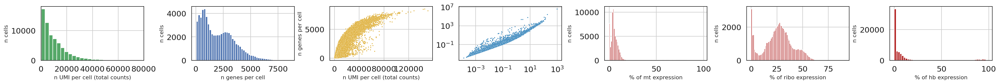

In [ ]:
qc(adata)

In [ ]:
sce.pp.scrublet(adata)
print(adata.obs['predicted_doublet'].value_counts())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


predicted_doublet
False    67405
True        70
Name: count, dtype: int64


In [ ]:
adata.obs["outlier"] = (
    (is_outlier(adata, "log1p_total_counts", 5))
    | (is_outlier(adata, "log1p_n_genes_by_counts", 5))
    # | (is_outlier(adata, "pct_counts_in_top_20_genes", 5))
    | (is_outlier(adata, "pct_counts_mt", 3))
    | (adata.obs["pct_counts_mt"] > 15)
)

adata.obs.outlier.value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,count
outlier,
False,60421
True,7054


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


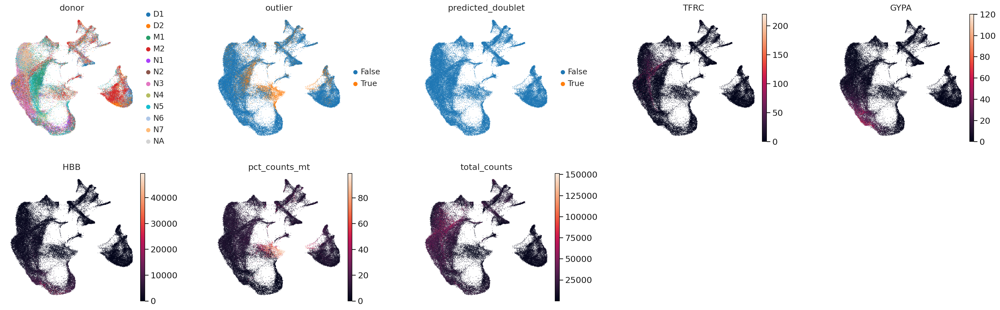

In [ ]:
sc.pl.umap(adata, color = ["donor", 'outlier', 'predicted_doublet', "TFRC", "GYPA", "HBB", "pct_counts_mt", 'total_counts'], wspace=0.4, ncols = 5,)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


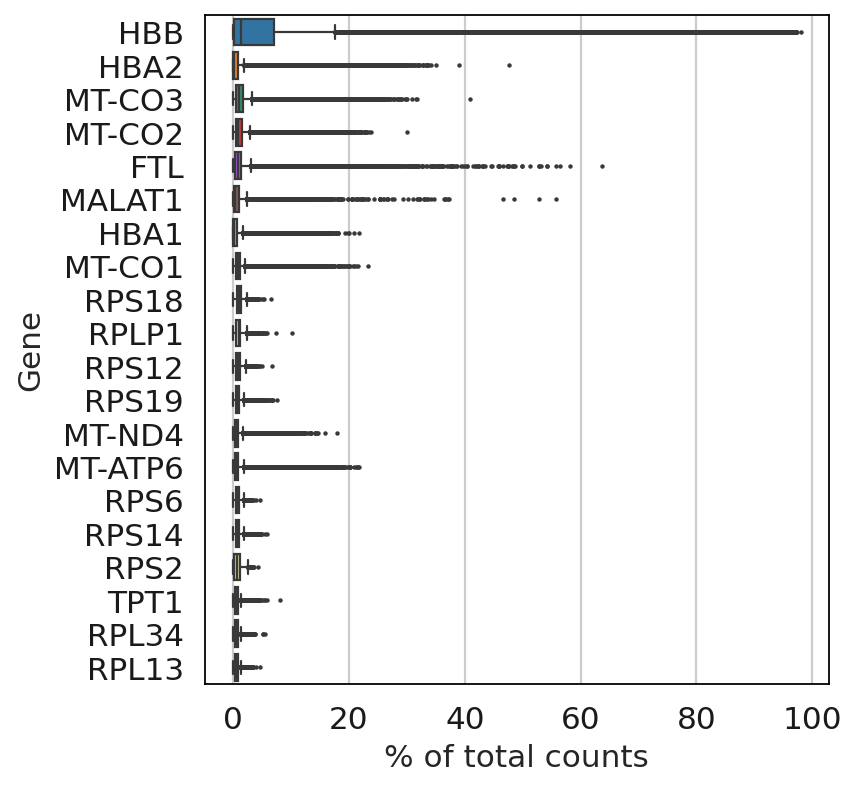

In [ ]:
sc.pl.highest_expr_genes(adata, 20)

In [ ]:
print(adata.shape)
adata = adata[~adata.obs["outlier"]]
adata = adata[~adata.obs["predicted_doublet"]]
print(adata.shape)

(67475, 18827)
(60372, 18827)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


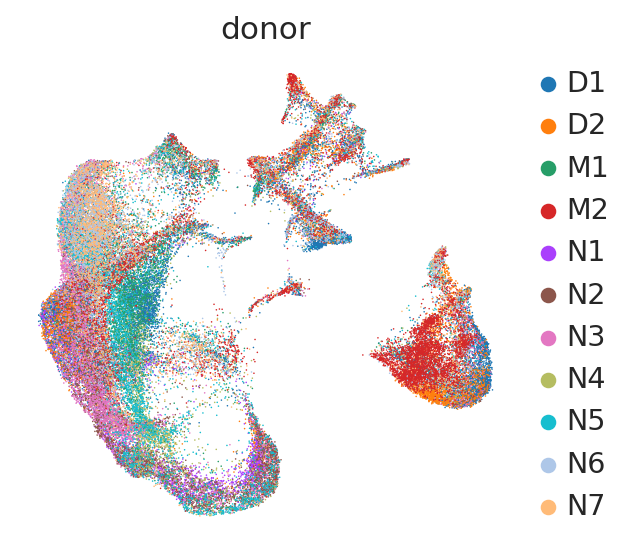

In [ ]:
sc.pl.umap(adata, color = ["donor"])

### Full

#### Celltypist annotation

In [ ]:
adata.X.max()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


49289.0

In [ ]:
# adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=3000, layer="counts", flavor="seurat_v3", batch_key = 'donor')
sc.pp.pca(adata, use_highly_variable = True)
sce.pp.bbknn(adata, batch_key='donor')
sc.tl.umap(adata)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


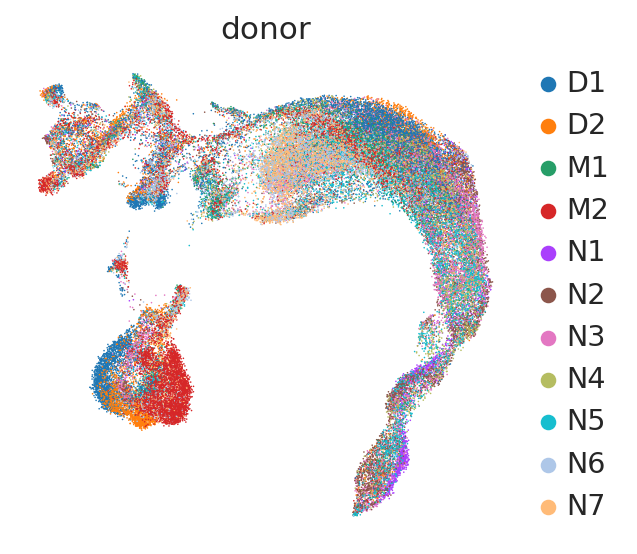

In [ ]:
sc.pl.umap(adata, color = 'donor')

In [ ]:
import celltypist
from celltypist import models
models.download_models(force_update = True)
model_fine = models.Model.load(model="Immune_All_Low.pkl")
model_coarse = models.Model.load(model="Immune_All_High.pkl")

In [ ]:
predictions = celltypist.annotate(adata, model=model_coarse, majority_voting=True)
pred_adata = predictions.to_adata()
adata.obs["celltypist_pred_coarse_labels"]  = pred_adata.obs["predicted_labels"]
adata.obs["celltypist_pred_coarse_voting"] = pred_adata.obs["majority_voting"]
adata.obs["celltypist_pred_coarse_conf_score"] = pred_adata.obs["conf_score"]

predictions = celltypist.annotate(adata, model=model_fine, majority_voting=True)
pred_adata = predictions.to_adata()
adata.obs["celltypist_pred_fine_labels"]  = pred_adata.obs["predicted_labels"]
adata.obs["celltypist_pred_fine_voting"] = pred_adata.obs["majority_voting"]
adata.obs["celltypist_pred_fine_conf_score"] = pred_adata.obs["conf_score"]

In [ ]:
adata.X = adata.layers["counts"].copy()

#### Manual annotation

In [ ]:
pd.crosstab(adata.obs['day'], adata.obs['exp'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


exp,E1,E2,E3,E4,E5
day,,,,,
0,6885,6101,1163,1854,3740
3,0,3336,2387,1153,5246
6,5081,9212,3625,4813,5776


In [ ]:
adata.X = adata.layers['lognorm'].copy()
sc.pp.highly_variable_genes(adata, n_top_genes=5000, layer="lognorm", flavor="cell_ranger", batch_key="day_exp")
sc.pp.pca(adata, use_highly_variable = True)
sce.pp.bbknn(adata, batch_key='day_exp')
# sce.pp.harmony_integrate(adata, key = "donor", basis='X_pca', adjusted_basis='X_pca_harmony')
# sc.pp.neighbors(adata, use_rep = 'X_pca_harmony')
sc.tl.umap(adata)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


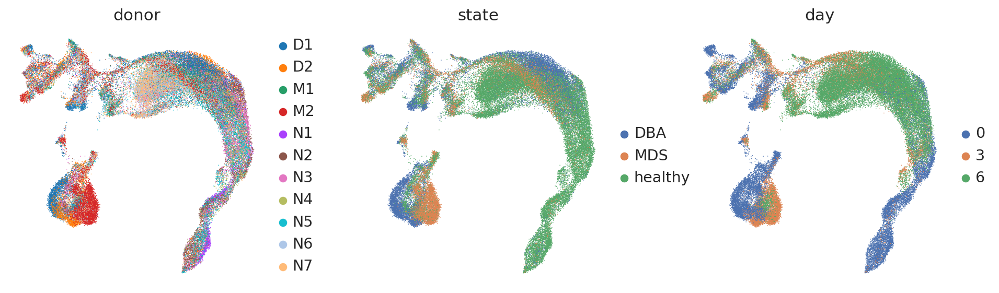

In [ ]:
sc.pl.umap(adata, color = ['donor', 'state', 'day'])

In [ ]:
adata.X = adata.layers["lognorm"].copy()
markers = dict(
  Tcell = ['CD3D','TRAC','CD8A','CD4','CXCR4'] + ['BTG1'],
  Mac = ['TYROBP','FCER1G','CD14','S100A8','S100A9','LYZ'],
  Bcell = ['CD27','CD74','CD79B','IGKC','IGHM','MZB1'],
  DC = ['PLD4','ITM2C','JCHAIN','CD40','PLIN2','LGALS3BP'],
  NK = ['GNLY','NKG7','PRF1','KLRB1','GZMA', 'CTSW'],
  Neu = ['PRSS57','SMIM24','ELANE','AZU1','PRTN3','CFD'],
  Ery = ['HBA1','CA1','SLC4A1','GYPA','TFRC','HMGA1'],
  Meg = ['CD9', 'LOX', 'VWF', 'NFIB', 'TGFB1', 'FLI1'],
  Mast = ['CCL2', 'CREB3L1', 'GNAI1', 'PLAU', 'KCNE3', 'SRGN'],
  MPP = ['KIT', 'CCL2', 'GATA2', 'GATA4', 'RUNX1', 'TRIM33'],
  CLP = ['SPINK2', 'CD79A','EBF1','IGHM'], #'DNTT',
  Mito = ['MT-ND1','MT-ND3','MT-ND4','MT-CO2','MT-CYB'],
  Hb = ['HBA1','HBA2','HBB','HBG1','HBG2','HBD','HBE1','HBZ']
  )

adata.uns['markers'] = markers

for i in adata.uns['markers'].keys():
  sc.tl.score_genes(adata, adata.uns['markers'][i], score_name=i)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


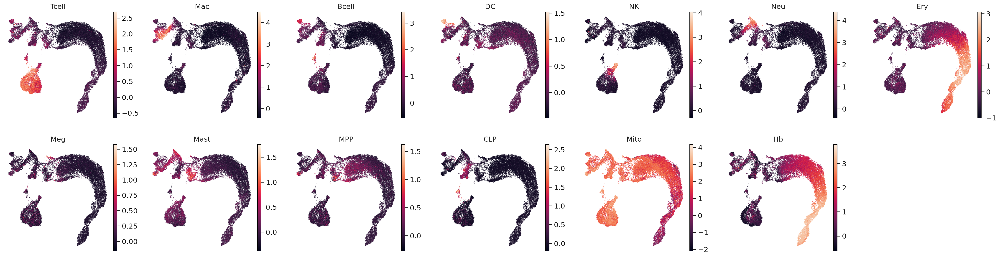

In [ ]:
sc.pl.umap(adata, color = markers, ncols = 7, )

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


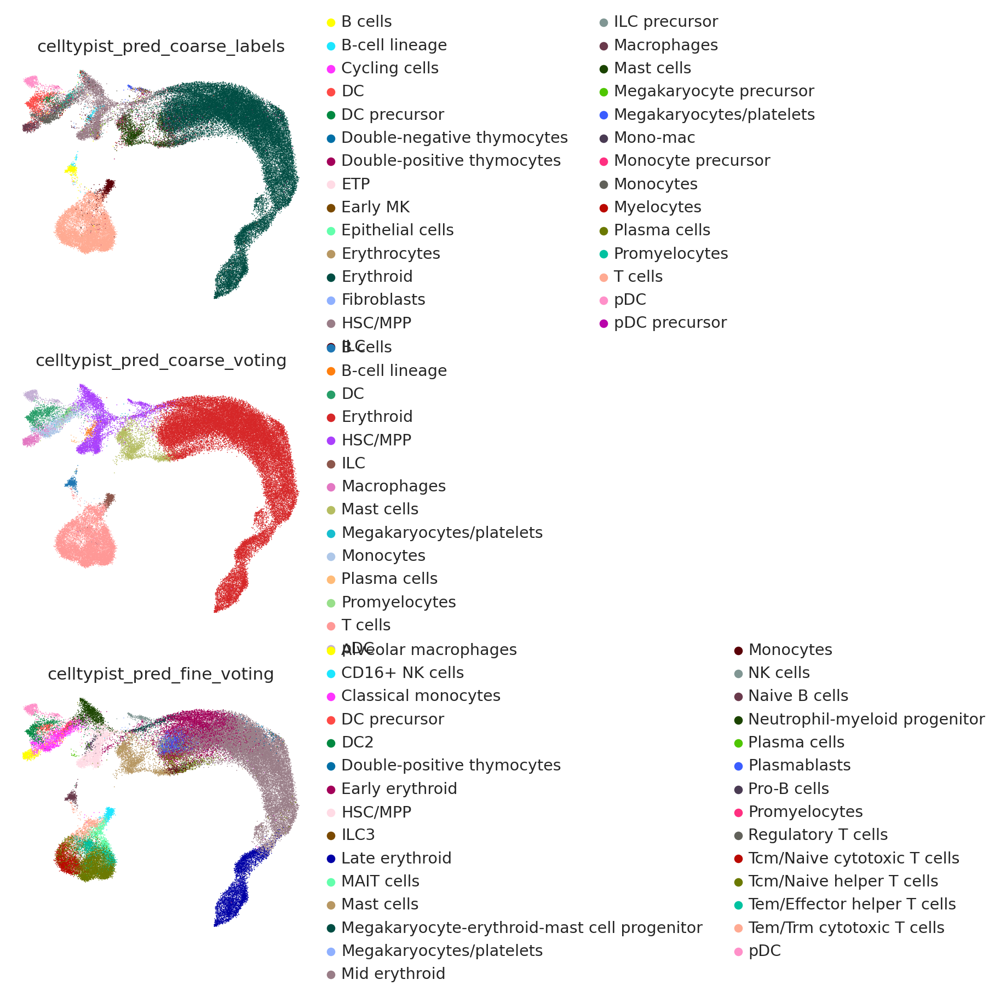

In [ ]:
sc.pl.umap(adata, color = ['celltypist_pred_coarse_labels', 'celltypist_pred_coarse_voting', 'celltypist_pred_fine_voting'], ncols = 1)

In [ ]:
for i in [0.5, 1, 1.5, 2]:
  print(i)
  sc.tl.leiden(adata, resolution = i, key_added = "leiden_res_" + str(i))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0.5
1
1.5
2


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


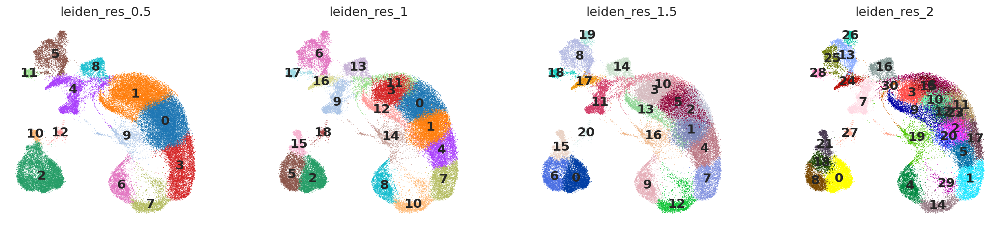

In [ ]:
sc.pl.umap(adata, color = [i for i in adata.obs.columns if "leiden_res" in i], legend_loc = 'on data')

In [ ]:
## Annotation based on leiden-1.5
leiden_to_ct = {
    "21" : "B cells",
    "19" : "NK cells",
    "0" : "T cells", "11" : "T cells", "12" : "T cells",
    "22" : "Megacaryocyte precursors",
    "6" : "HSCs/LMPPs",
    "9" : "Reticulocytes",
    "13" : "Erythroid cells", "7" : "Erythroid cells",
    "14" : "Erythroid precursors", "15" : "Erythroid precursors", "1" : "Erythroid precursors", "3" : "Erythroid precursors",
    "3" : "Erythroid precursors", "2" : "Erythroid precursors", "18" : "Erythroid precursors", "4" : "Erythroid precursors", "10" : "Erythroid precursors",
    "16" : "Ba/Eo/Ma precursors",
    "17" : "Neutrohil-myeloid progenitors",
    "5" : "Monocytes",
    "20" : "Macrophages",
    "18" : 'Dendritic cells',
    "8" : "EMPs"
    }
adata.obs['anno'] = [leiden_to_ct[i] for i in adata.obs["leiden_res_1.5"]]
adata.obs['anno'] = adata.obs['anno'].astype("category")

print(set(adata.obs['anno']))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


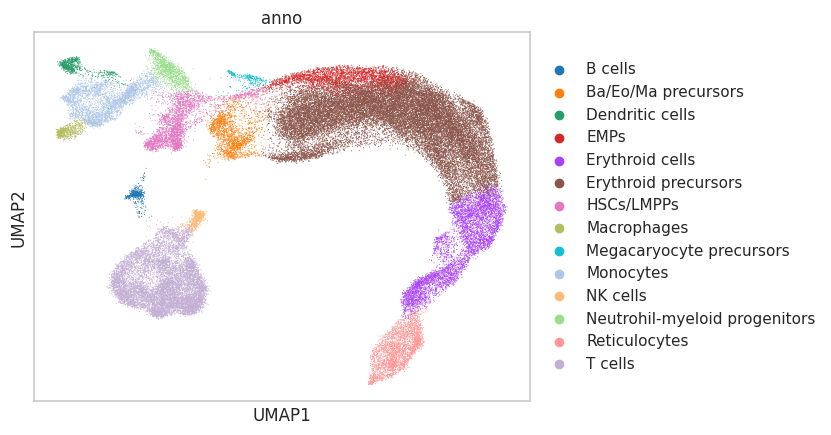

In [ ]:
sc.pl.umap(adata, color = 'anno')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


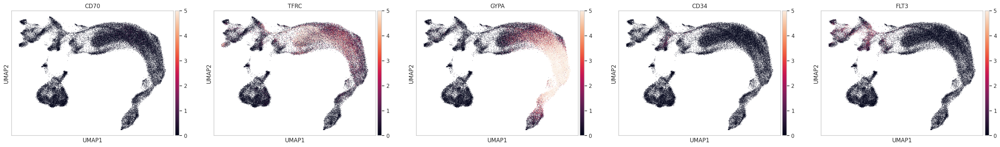

In [ ]:
sc.pl.umap(adata, layer = 'counts', color = ['CD70', "TFRC", "GYPA", "CD34", "FLT3"], vmax = [5, 5, 5, 5, 5], ncols = 5)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


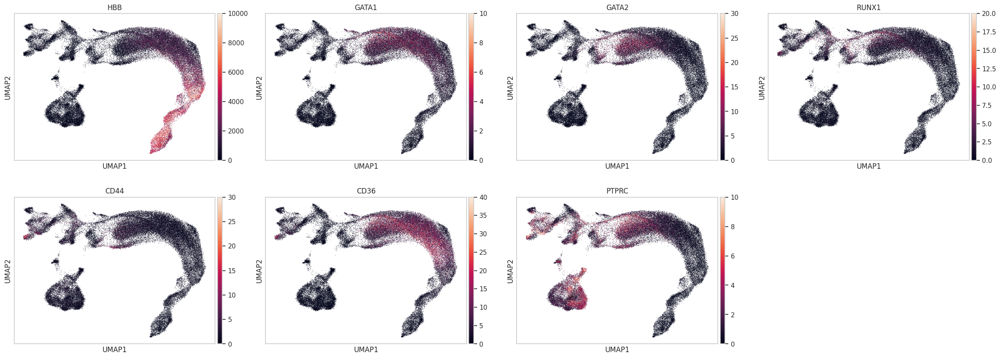

In [ ]:
sc.pl.umap(adata, layer = 'counts', color = ["HBB", "GATA1", "GATA2", "RUNX1", "CD44", "CD36", "PTPRC",], ncols = 4, vmax = [1e4, 10, 30, 20, 30, 40, 10])

### Write

In [ ]:
adata.write(path + "Doty_filtered_annotated.h5ad")

### Filter for day 0

In [ ]:
print(adata.shape)
adata = adata[adata.obs['day'] == "0"]
print(adata.shape)
adata.obs.rename(columns = {"id" : "donor"}, inplace = True)
adata.obs["state"] = adata.obs["donor"].replace({"D1" : "DBA", "D2" : "DBA", "M1" : "MDS", "M2" : "MDS",
                                                 "N1" : "healthy", "N2" : "healthy", "N3" : "healthy", "N4" : "healthy", "N5" : "healthy", "N6" : "healthy", "N7" : "healthy"})
adata = adata[~adata.obs['donor'].isin(["doublet", "unassigned", "unknown"])]
print(adata.shape)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(58625, 18827)
(19394, 18827)
(19394, 18827)


In [ ]:
adata.write(path + "Doty_filtered_annotated_day0.h5ad")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
adata.obs["donor"].value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,count
donor,
D1,3591
D2,2221
M2,1043
N2,925
N3,669
N6,657
N1,586
N7,497
N4,383


In [ ]:
print(adata.shape)
adata = adata[adata.obs['state'] != "MDS"]
print(adata.shape)

(11064, 18827)
(9901, 18827)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Celltypist annotation

In [ ]:
import celltypist
from celltypist import models
models.download_models(force_update = True)
model_fine = models.Model.load(model="Immune_All_Low.pkl")
model_coarse = models.Model.load(model="Immune_All_High.pkl")

In [ ]:
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=3000, layer="counts", flavor="seurat_v3")
sc.pp.pca(adata, use_highly_variable = True)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


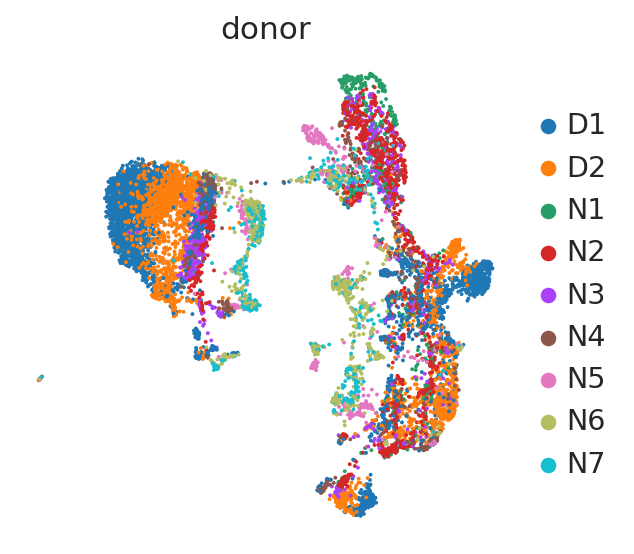

In [ ]:
sc.pl.umap(adata, color = 'donor')

In [ ]:
predictions = celltypist.annotate(adata, model=model_coarse, majority_voting=True)
pred_adata = predictions.to_adata()
adata.obs["celltypist_pred_coarse_labels"]  = pred_adata.obs["predicted_labels"]
adata.obs["celltypist_pred_coarse_voting"] = pred_adata.obs["majority_voting"]
adata.obs["celltypist_pred_coarse_conf_score"] = pred_adata.obs["conf_score"]

predictions = celltypist.annotate(adata, model=model_fine, majority_voting=True)
pred_adata = predictions.to_adata()
adata.obs["celltypist_pred_fine_labels"]  = pred_adata.obs["predicted_labels"]
adata.obs["celltypist_pred_fine_voting"] = pred_adata.obs["majority_voting"]
adata.obs["celltypist_pred_fine_conf_score"] = pred_adata.obs["conf_score"]

In [ ]:
adata.X = adata.layers["counts"].copy()

#### Manual annotation

In [ ]:
adata.obs['donor'] = adata.obs['donor'].cat.remove_unused_categories()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
adata.X.max()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


21607.0

In [ ]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.layers['lognorm'] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes=2000, layer="lognorm", flavor="cell_ranger", batch_key = "donor")
sc.pp.pca(adata, use_highly_variable = True)
# sce.pp.bbknn(adata, batch_key='donor')
sce.pp.harmony_integrate(adata, key = "donor", basis='X_pca', adjusted_basis='X_pca_harmony')
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony')
sc.tl.umap(adata)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
2024-09-03 09:43:09,660 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2024-09-03 09:43:12,646 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2024-09-03 09:43:12,715 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2024-09-03 09:43:16,841 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2024-09-03 09:43:22,024 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2024-09-03 09:43:25,744 - harmonypy - INFO - Iteration 

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


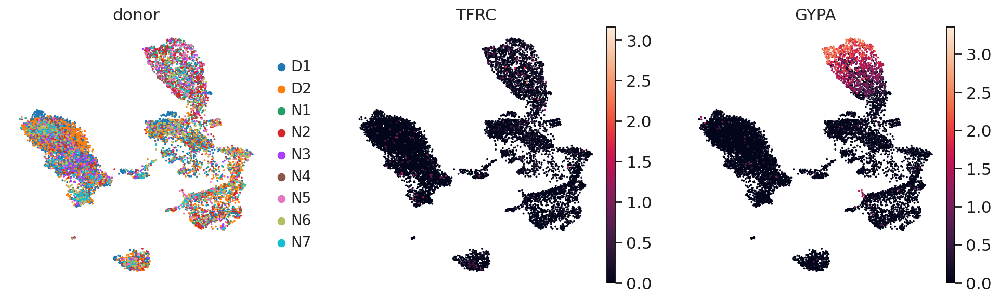

In [ ]:
sc.pl.umap(adata, color = ['donor', 'TFRC', "GYPA"])